project 3: https://chatgpt.com/c/45a31194-0777-46a0-a91d-1cbd79deb554

importing libraries

In [24]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

reading the image in grayscale

In [3]:
image = cv2.imread('resources/image1.jpg', cv2.IMREAD_GRAYSCALE)

In [4]:
sift = cv2.SIFT_create()
keypoints_sift = sift.detect(image, None)

In [5]:
orb = cv2.ORB_create()
keypoints_orb = orb.detect(image, None)

(Text(0.5, 1.0, 'SIFT Keypoints'), (-0.5, 2047.5, 1364.5, -0.5))

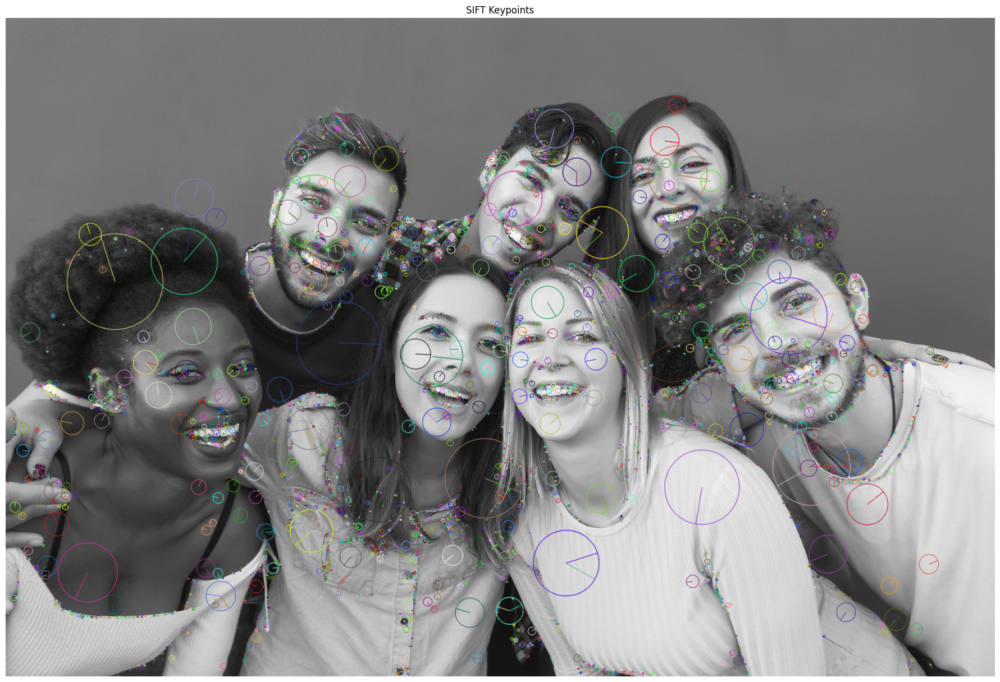

In [14]:
image_sift = cv2.drawKeypoints(image, keypoints_sift, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
image_orb = cv2.drawKeypoints(image, keypoints_orb, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(50, 25))
plt.subplot(1, 2, 1), plt.imshow(image_sift)
plt.title('SIFT Keypoints'), plt.axis('off')

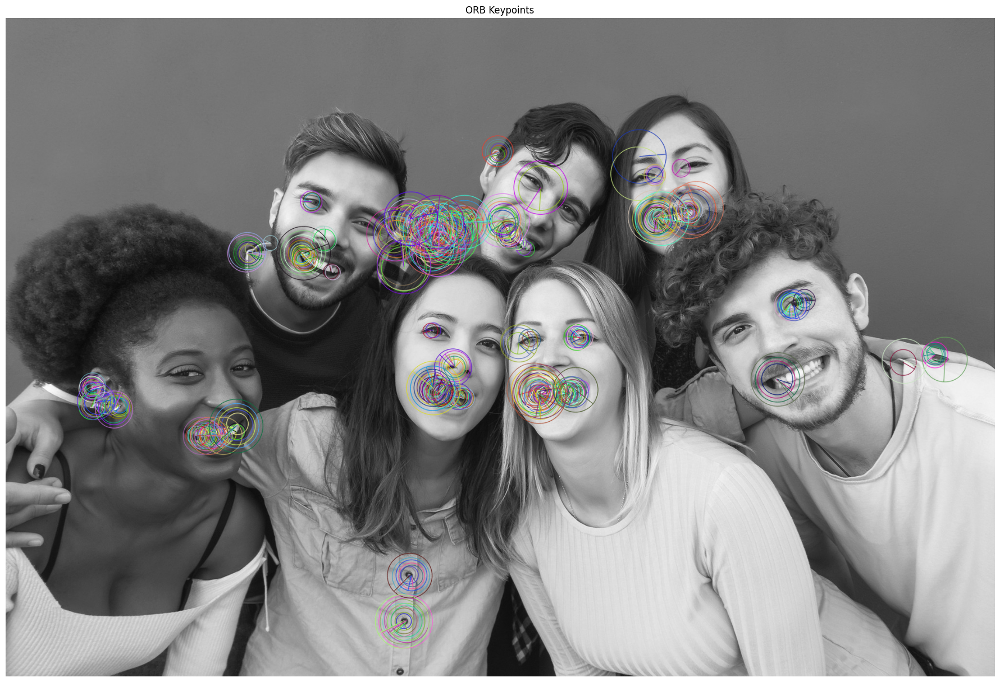

In [13]:
plt.figure(figsize=(50, 25))
plt.subplot(1, 2, 2), plt.imshow(image_orb)
plt.title('ORB Keypoints'), plt.axis('off')

plt.show()

Computing the descriptors

In [15]:
keypoints_sift, descriptors_sift = sift.detectAndCompute(image, None)
keypoints_orb, descriptors_orb = orb.detectAndCompute(image, None)

visualising the descriptors

In [16]:
print("SIFT Descriptors:", descriptors_sift.shape)
print("ORB Descriptors:", descriptors_orb.shape)

SIFT Descriptors: (3603, 128)
ORB Descriptors: (500, 32)


Let's try feature matching

In [17]:
image1 = cv2.imread('resources/image3.jpg', cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread('resources/image4.jpg', cv2.IMREAD_GRAYSCALE)

detecting and computing descriptors using sift and orb

In [18]:
# For image1
keypoints1_sift, descriptors1_sift = sift.detectAndCompute(image1, None)
keypoints1_orb, descriptors1_orb = orb.detectAndCompute(image1, None)

# For image2
keypoints2_sift, descriptors2_sift = sift.detectAndCompute(image2, None)
keypoints2_orb, descriptors2_orb = orb.detectAndCompute(image2, None)

Matching features using brute force

In [20]:
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)  # For SIFT
matches_sift = bf.match(descriptors1_sift, descriptors2_sift)
matches_sift = sorted(matches_sift, key=lambda x: x.distance)

bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)  # For ORB
matches_orb = bf.match(descriptors1_orb, descriptors2_orb)
matches_orb = sorted(matches_orb, key=lambda x: x.distance)

Visualising matches

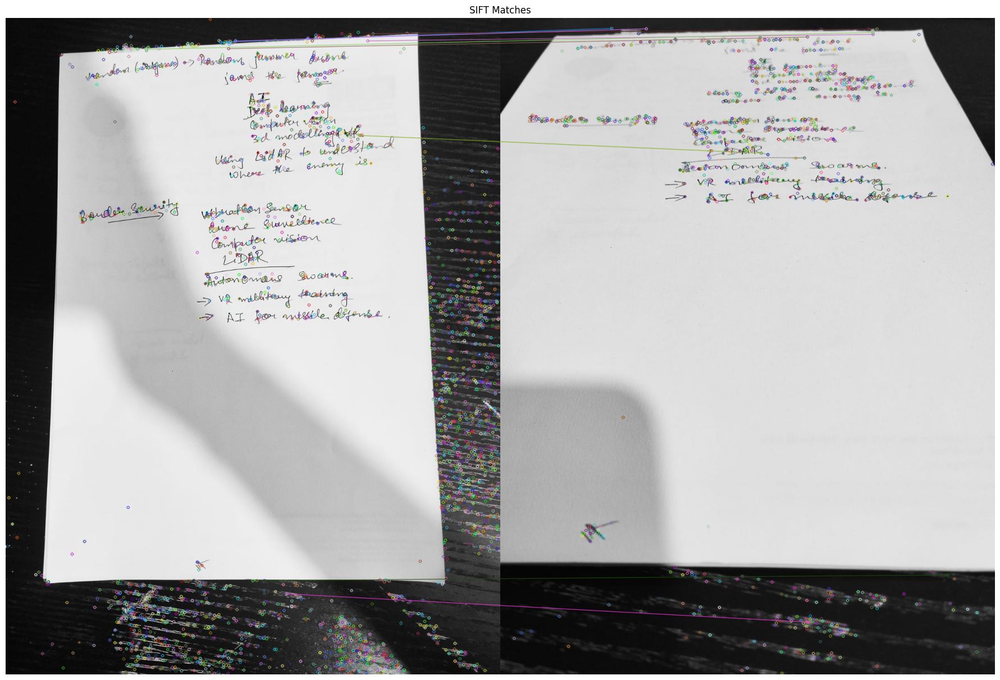

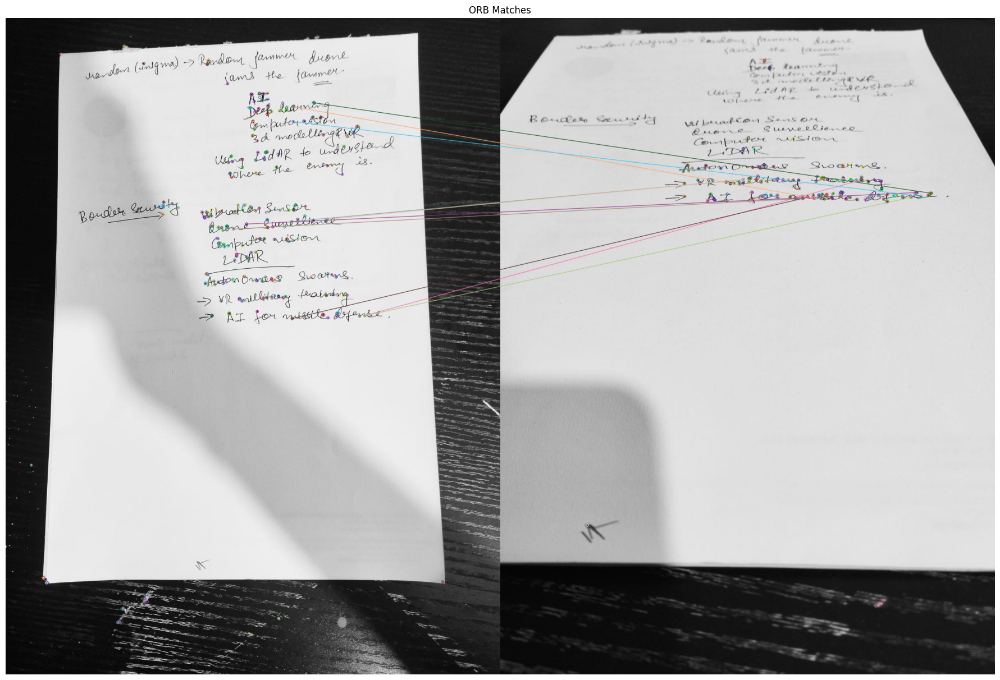

In [22]:
image_matches_sift = cv2.drawMatches(image1, keypoints1_sift, image2, keypoints2_sift, matches_sift[:10], None)
image_matches_orb = cv2.drawMatches(image1, keypoints1_orb, image2, keypoints2_orb, matches_orb[:10], None)

plt.figure(figsize=(50, 25))
plt.subplot(1, 2, 1), plt.imshow(image_matches_sift)
plt.title('SIFT Matches'), plt.axis('off')
plt.show()

plt.figure(figsize=(50, 25))
plt.subplot(1, 2, 2), plt.imshow(image_matches_orb)
plt.title('ORB Matches'), plt.axis('off')
plt.show()

Let's go advanced

FLANN-Based Matcher

In [23]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)
matches_flann = flann.knnMatch(descriptors1_sift, descriptors2_sift, k=2)

# Apply ratio test
good_matches = []
for m, n in matches_flann:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

RANSAC for Outlier Removal

In [25]:
src_pts = np.float32([keypoints1_sift[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
dst_pts = np.float32([keypoints2_sift[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
matches_mask = mask.ravel().tolist()


Visualize RANSAC Matches

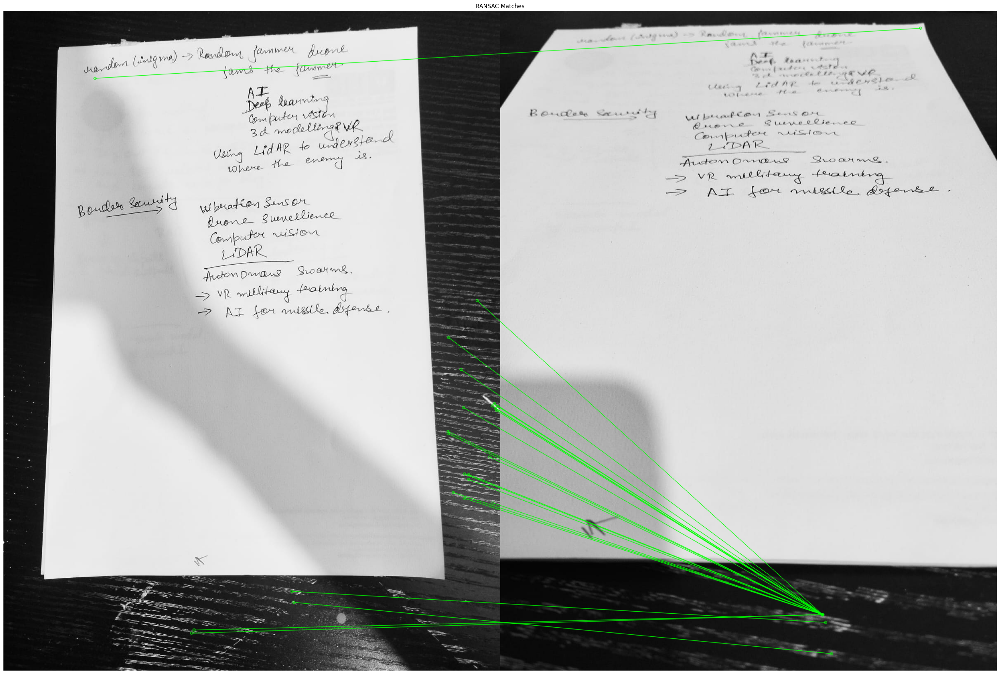

In [28]:
draw_params = dict(matchColor=(0, 255, 0),  # Draw matches in green color
                   singlePointColor=None,
                   matchesMask=matches_mask,  # Draw only inliers
                   flags=2)

image_ransac_matches = cv2.drawMatches(image1, keypoints1_sift, image2, keypoints2_sift, good_matches, None, **draw_params)

plt.figure(figsize=(50, 25))
plt.imshow(image_ransac_matches)
plt.title('RANSAC Matches')
plt.axis('off')
plt.show()